In [71]:
import sys
sys.path.append('../src/')
from xpcs import *
from sims import *
from autocorrelations import *
import cv2
from scipy.special import erfinv
import pyopencl as cl
from pathlib import Path
import matplotlib.cm as cm
import json
import matplotlib.ticker as ticker
from scipy.fft import fft, ifft, fftfreq
%matplotlib notebook

In [3]:
CONFIG_FILE_NAME = "NPS_11092023_processed_config.json"

figure_path = '/Users/eriklamb/Documents/Publications/NPS_Petra/Figures/'


# Define the path to the configuration file
config_path = Path("/Users/eriklamb/Documents/Python/Projects/XPCS/configs/"+CONFIG_FILE_NAME)

# Open and load the JSON configuration file
with open(config_path, "r") as file:
    config = json.load(file)
    #json_str = json.loads(jsonString, strict=False)

In [4]:
T = 298

BASE = Path(config.get("BASE"))
file_processed = BASE/Path(config.get(f"{T}_processed"))
file_results = BASE/Path(config.get(f"{T}_results"))

with h5py.File(file_processed, 'r') as DATA:
    det          = DATA['data/det'][:]
    frameSpacing = DATA['experimental_parameters/frame_spacing'][:][0]
    
with h5py.File(file_results, 'r') as DATA:
    masks        = DATA['XPCS/Mask'][:]
    dQ           = DATA['XPCS/dQ'][:]

# Calculate All Two-Times

In [5]:
TwoTimes = np.zeros((masks.shape[0],det.shape[0],det.shape[0]))
C_extent = [0,frameSpacing*det.shape[0],0,frameSpacing*det.shape[0]]

for i,M in enumerate(masks):
    
    IMG_temp = det[:,M==1]
    #IMG_temp = det[:,mask_sum>0]
    IMGS_NORM = IMG_temp.reshape((IMG_temp.shape[0],IMG_temp.shape[1],1))
    #IMGS_NORM = IMG_temp.reshape((650,IMG_temp.shape[1],1))


    C = twotime(IMGS_NORM)#/np.size(det[:,masks[M,:,:]==1])


    TwoTimes[i,:,:] = (C-np.min(C))/(np.max(C)-np.min(C))

<IPython.core.display.Javascript object>


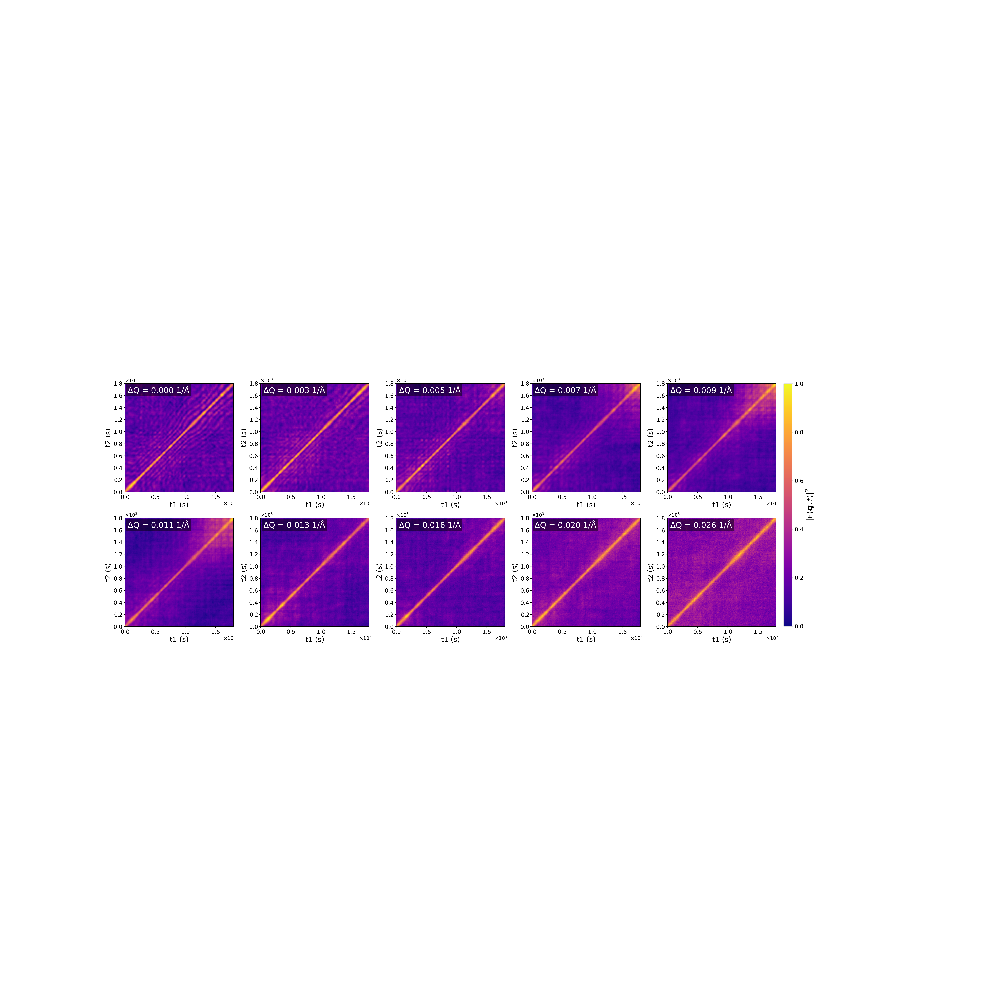

In [116]:
fig, ax = plt.subplots(2,5,figsize=(35,35))

m = 0
for i in range(2):
    for j in range(5):

        
        
        im = ax[i,j].imshow(TwoTimes[m,:,:],origin="lower",extent=C_extent,vmin = 0,vmax = 1,cmap='plasma')
        
        ax[i,j].set_ylabel('t2 (s)',fontsize=18)
        ax[i,j].set_xlabel('t1 (s)',fontsize=18)
        
        ax[i,j].text(0.024, 0.978, f'$\\Delta$Q = {dQ[m]-dQ[0]:0.3f} 1/Å', color='white', fontsize=20,
              ha='left', va='top', transform=ax[i,j].transAxes,
              bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        #ax[i,j].set_title(f'dQ = {dQ[m]-dQ[0]:0.3f} 1/Å')
        
        
        ax[i,j].xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
        ax[i,j].xaxis.get_offset_text().set_fontsize(12)  # Adjust font size if needed
        ax[i,j].xaxis.get_offset_text().set_position((1.02, 0))  # Move offset label slightly

        ax[i,j].yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
        ax[i,j].yaxis.get_offset_text().set_fontsize(12)
        ax[i,j].yaxis.get_offset_text().set_position((0, 1.02))  # Move offset label slightly

        ax[i,j].ticklabel_format(axis='both', style='sci', scilimits=(0, 0))  # Force scientific notation

        ax[i,j].tick_params(axis='both', which='major', labelsize=14)
        ax[i,j].tick_params(axis='both', which='minor', labelsize=14)

        plt.subplots_adjust(wspace=0.25, hspace=-0.788)
        
        m+=1
#fig.colorbar(im, ax=ax)
# Flatten axs to a list in case it's 2D (like axs[2,4])
cbar = fig.colorbar(im, ax=ax.ravel().tolist(),location='right',shrink=0.315, aspect=30,pad=0.01)
cbar.set_label(r'$|F(\boldsymbol{q},t)|^2$', fontsize=20)
cbar.ax.tick_params(labelsize=14)

#fig.colorbar(im, ax=ax, location='right', fraction=0.00838, pad=0.003)



plt.show

fig.savefig(figure_path+f"twotime_{T}K.pdf",format="pdf",bbox_inches="tight")


<IPython.core.display.Javascript object>


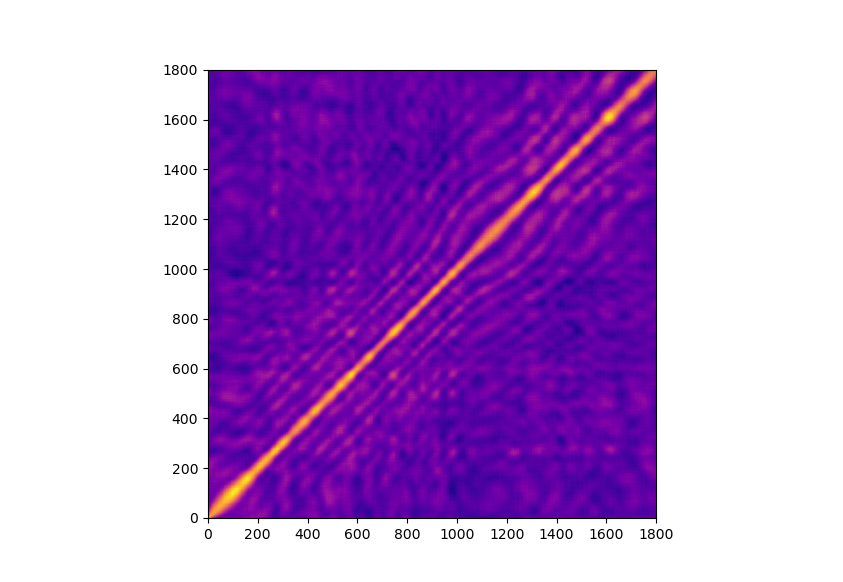

In [28]:
fig,ax = plt.subplots()

ax.imshow(np.flip(TwoTimes[0,:,:],axis=0),extent=C_extent,vmin = 0,vmax = 1,cmap='plasma')

In [33]:
import numpy as np

def diag_cut(C, t, k=0, width=0):
    """
    k: offset in indices (k>0 above main diagonal, k<0 below)
    width: average over a band of offsets [k-width, ..., k+width] to improve SNR
    Returns: center_time, lag, values
    """
    N = C.shape[0]
    offs = range(k-width, k+width+1)
    vals_acc = None; count = 0
    # accumulate band-averaged offset diagonals
    for kk in offs:
        if kk >= 0:
            i = np.arange(0, N-kk)
            j = i + kk
        else:
            j = np.arange(0, N+kk)
            i = j - kk
        v = C[i, j]
        if vals_acc is None:
            vals_acc = np.zeros_like(v, dtype=float)
            i0, j0 = i, j
        # align lengths by trimming to the shortest
        L = min(len(vals_acc), len(v))
        vals_acc[:L] += v[:L]
        count += 1
    vals = vals_acc[:L] / count
    i = i0[:L]; j = j0[:L]
    t_center = 0.5*(t[i] + t[j])         # tw (center/age time)
    tau = (t[j] - t[i])                  # lag corresponding to this sideband
    return t_center, tau, vals


<IPython.core.display.Javascript object>


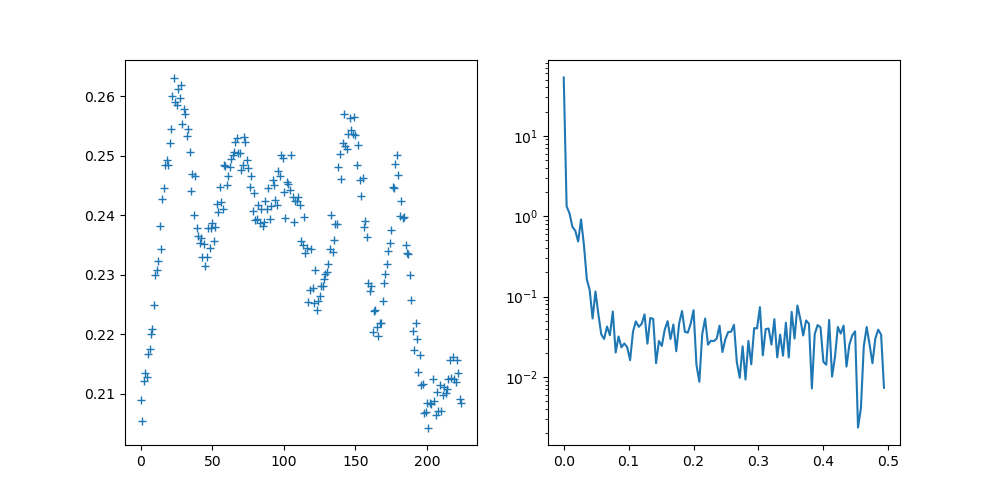

In [123]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
C = np.flip(TwoTimes[0,:,:],axis=0)
width = C.shape[1]//2
lag = C.diagonal()
t_center,tau,cut = diag_cut(C,t,0,width)
#ax[0].plot(lag[lag.shape[0]//2:])
ax[0].plot(cut[cut.shape[0]//2:],'+')

frequencies = fftfreq(cut.shape[0]//2,1)
power = np.abs(fft(cut[cut.shape[0]//2:]))
ax[1].semilogy(frequencies[:power.shape[0]//2],power[:power.shape[0]//2])

In [124]:
C.shape[1]//2

450

In [65]:
t_center.shape

(890,)

In [67]:
tau.shape

(890,)

In [68]:
cut.shape

(890,)